<a href="https://colab.research.google.com/github/yura123123/Computer_Vision_NULP/blob/main/Lab_1/CV_lab_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import image as img

In [19]:
# Roberts edge operator
kernel_Roberts_x = np.array( [[ 0, 0, 0 ],
                             [ 0, 1, 0 ],
                             [ 0, 0,-1 ]] )

kernel_Roberts_y = np.array( [[ 0, 0, 0 ],
                             [ 0, 0, 1 ],
                             [ 0,-1, 0 ]] )

In [20]:
# Sobel edge operator
kernel_Sobel_x = np.array([
    [-0.5, 0, 0.5],
    [-1, 0, 1],
    [-0.5, 0, 0.5]
])
kernel_Sobel_y = np.array([
    [0.5, 1, 0.5],
    [0, 0, 0],
    [-0.5, -1, -0.5]
])

In [39]:
# Plot few images in a row for comparison
def show_image(img, label) :
    dpi = 80
    width, height = img.shape
    figsize = width / float(dpi), height / float(dpi)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image
    
    ax.imshow(img, cmap='gray')
    plt.title(label)
    plt.show()

In [22]:
# Convert RGB image to grayscale
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])

In [23]:
def apply_filter(image, kernel):

    imageH, imageW = image.shape
    kernelH, kernelW = kernel.shape

    padding = kernel.shape[0] - 1
    h, w = imageH - 2 * kernelH + 2 * padding, imageW - 2 * kernelW + 2 * padding
    padded_img = np.zeros((image.shape[0] + padding*2, image.shape[1] + padding*2))
    padded_img[int(padding):int(-1 * padding), int(padding):int(-1 * padding)] = image
    
    output = np.zeros((h, w))
    for i in range(h):
        for j in range(w):
            output[i, j] = np.sum(image[i:i+kernelH, j:j+kernelW] * kernel)
    return output

In [24]:
# Read images
images = [
    img.imread('img/1.jpg'),
    img.imread('img/2.jpg'),
    img.imread('img/3.jpg'),
    img.imread('img/4.jpg'),
]

labels = [
    'Original',
    'Grayscale',
    'Roberts X',
    'Roberts Y',
    'Sobel X',
    'Sobel Y'
]

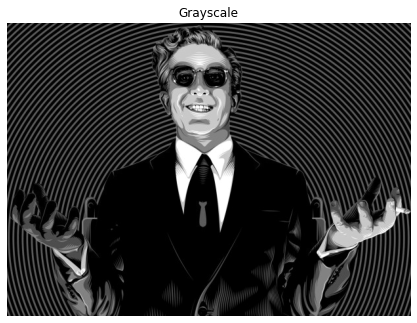

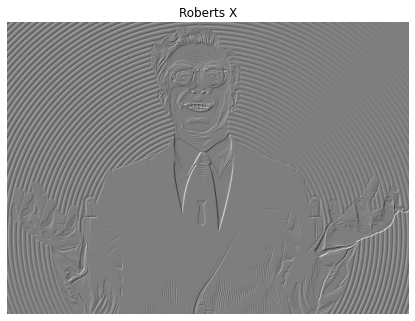

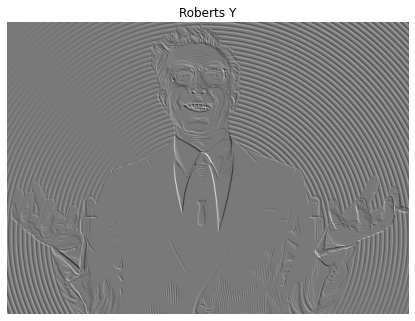

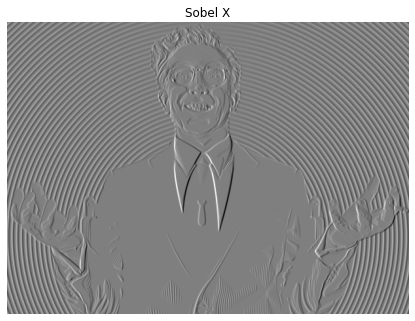

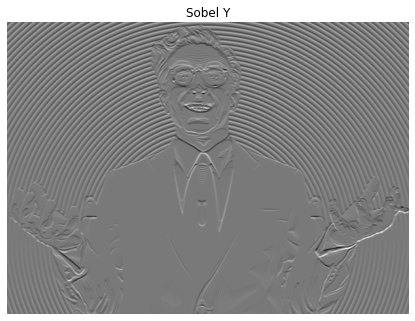

...

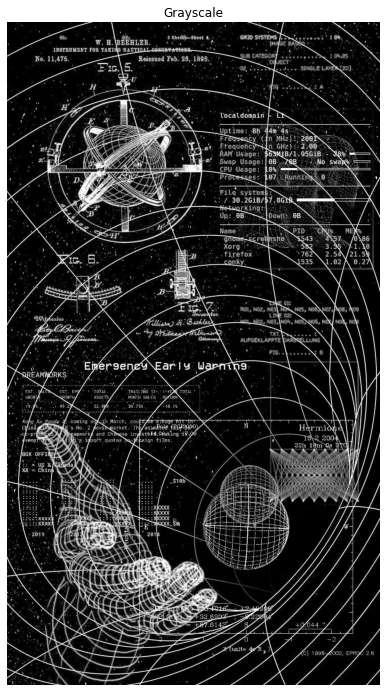

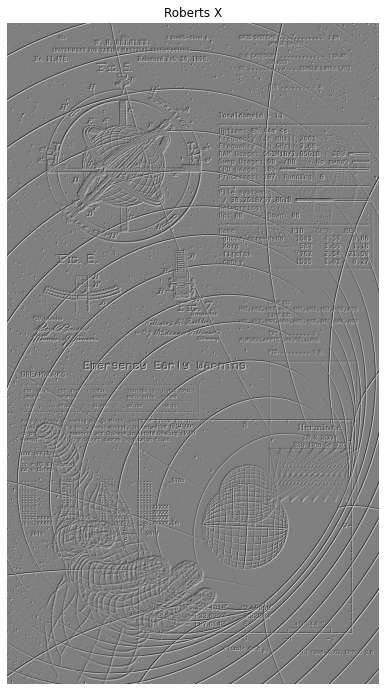

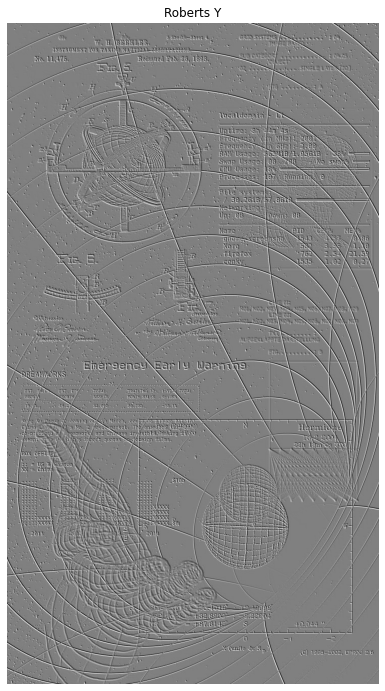

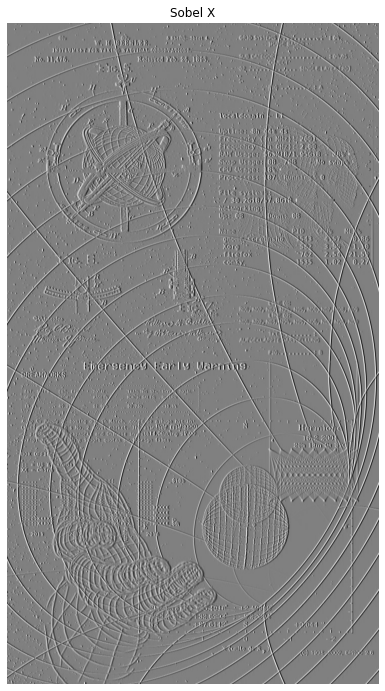

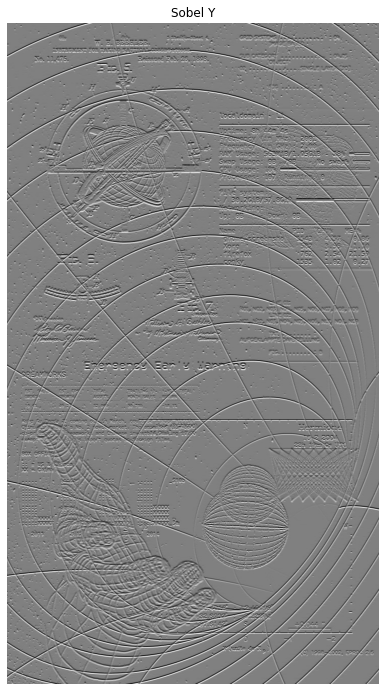

In [41]:
#show images
for img in images:
  show_image(rgb2gray(img),labels[1])
  show_image(apply_filter(rgb2gray(img), kernel_Roberts_x), labels[2])
  show_image(apply_filter(rgb2gray(img), kernel_Roberts_y), labels[3])
  show_image(apply_filter(rgb2gray(img), kernel_Sobel_x), labels[4])
  show_image(apply_filter(rgb2gray(img), kernel_Sobel_y), labels[5])